<a href="https://colab.research.google.com/github/m-njera/cv/blob/master/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Filters Visualization with Keras

### 1 - Uploading the dataset

In [0]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2019-11-28 15:16:59--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.193.128, 2607:f8b0:4001:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.193.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M   142MB/s    in 0.5s    

2019-11-28 15:17:00 (142 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



### 2 - Extracting the dataset

In [0]:
import os
import zipfile

local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

## Building and Training the model

In [0]:
import os
import numpy as np
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from keras import optimizers
import keras
import scipy
import pylab as pl
import matplotlib.cm as cm
%matplotlib inline

input_shape = (224, 224, 3)
img_width = 224
img_height = 224

nb_train_samples = 2000
nb_validation_samples = 1000
batch_size = 32
epochs = 10

base_dir = '/tmp/cats_and_dogs_filtered'
train_data_dir = os.path.join(base_dir, 'train')
validation_data_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_data_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_data_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_data_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_data_dir, 'dogs')

# used to rescale the pixel values from [0, 255] to [0, 1] interval
datagen = ImageDataGenerator(rescale=1./255)

# automagically retrieve images and their classes for train and validation sets
train_generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=16,
        class_mode='binary')

validation_generator = datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

model = keras.applications.vgg16.VGG16()
model.summary()

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
___________________________________________

## Plotting Accuracy and Loss charts

In [0]:
l1 = model.get_weights()[0]
l1 = l1.reshape(64,3,3,3)
print(l1[0].shape)

(3, 3, 3)


<Figure size 432x288 with 0 Axes>

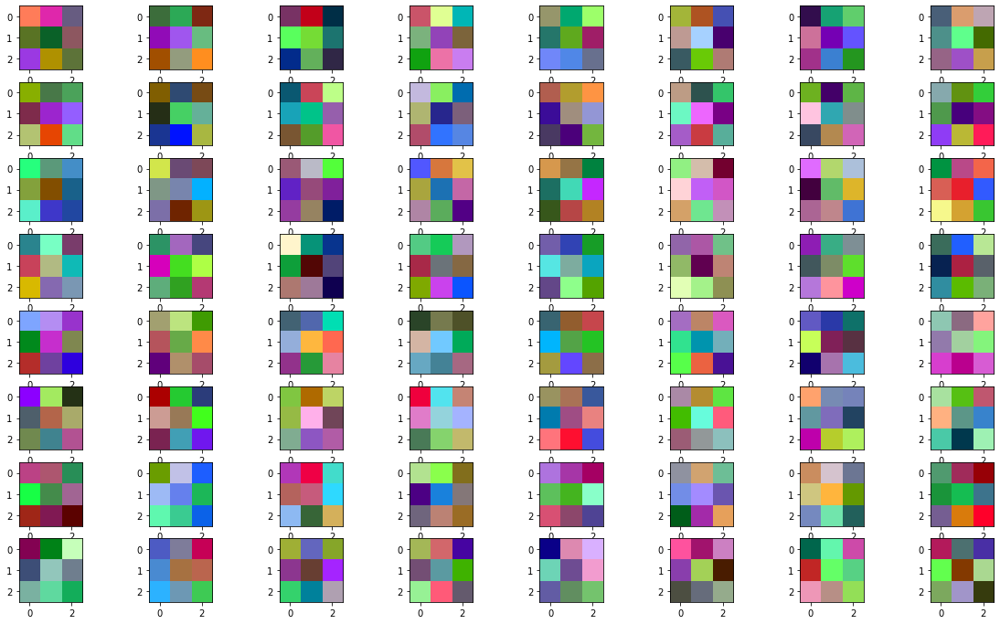

In [0]:
import cv2
import matplotlib.pyplot as plt


img = l1[0].copy()

# Normalization for visualization
cv2.normalize(img,  img, 0, 255, cv2.NORM_MINMAX)
fig = plt.figure()
# 8x8 - 64 filters
row_size = 8
col_size = 8
fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*2.5,col_size*1.5))
filter_id=0
for row in range(0,row_size):
    for col in range(0,col_size):
        cv2.normalize(l1[filter_id].copy(),  l1[filter_id], 0, 255, cv2.NORM_MINMAX)
        ax[row][col].imshow(l1[filter_id].astype('uint8'))
        filter_id += 1

## Preparing the image to visualization

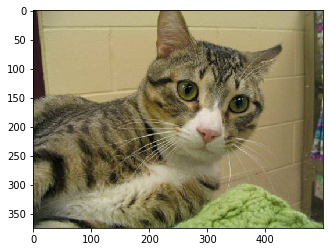

In [0]:
from keras.preprocessing import image
import matplotlib.pyplot as plt

input_image_path = '/tmp/cats_and_dogs_filtered/validation/cats/cat.2012.jpg'

# Show our input Image for Feature visualization
img1 = image.load_img(input_image_path)
plt.imshow(img1);

img_size = (224, 224)
# load imamge into a 4D Tensor, convert it to a numpy array and expand to 4 dim
img1 = image.load_img(input_image_path, target_size = img_size)
image_tensor = image.img_to_array(img1)
#print(image_tensor.shape)
image_tensor = image_tensor/255
image_tensor = np.expand_dims(image_tensor, axis=0)
#print(img.shape)

## Creating a model from an input tensor and list of output tensors

In [0]:
from keras import models

# Extracts the top 8 layers
layer_outputs = [layer.output for layer in model.layers[1:9]]

# Creates a model that returns these outputs given the model input
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

### Running the image cat.2012 through the model's prediction function

In [0]:
activations = activation_model.predict(image_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 64)


### Visualizing the 1th channel

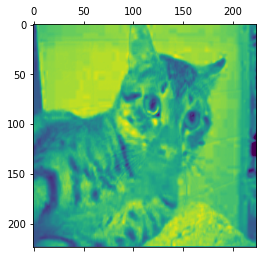

In [0]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 1], cmap='viridis')

### Visualizing the 7th channel

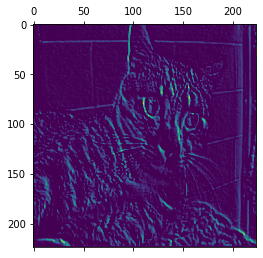

In [0]:
plt.matshow(first_layer_activation[0, :, :, 6], cmap='viridis')

### Visualizing all the 32 channels

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


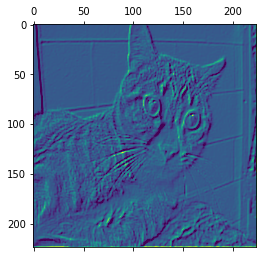

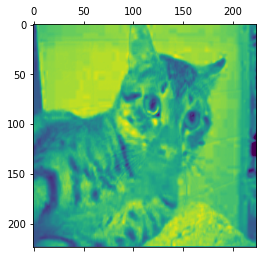

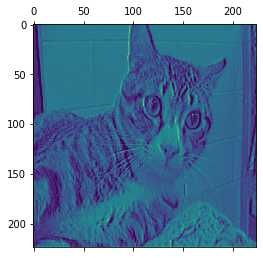

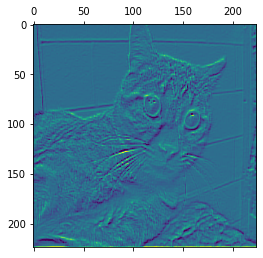

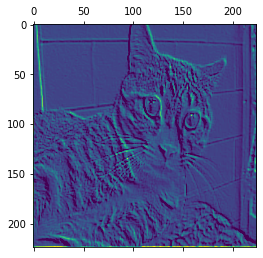

...

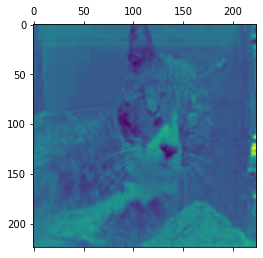

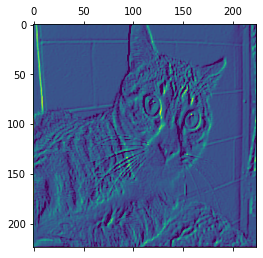

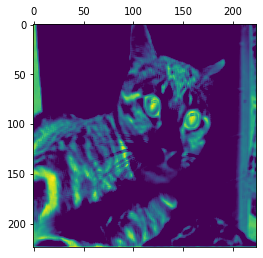

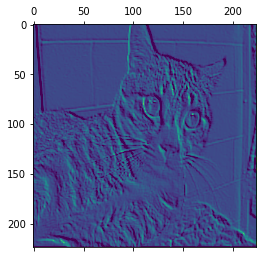

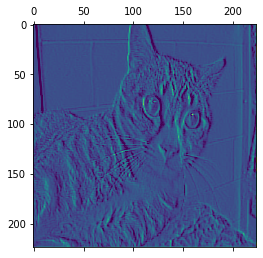

In [0]:
for i in range(0,64):
    plt.matshow(first_layer_activation[0, :, :,i], cmap='viridis')

### Visualizing every layer activation

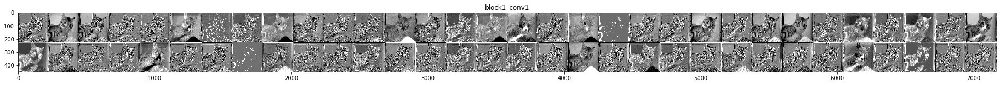

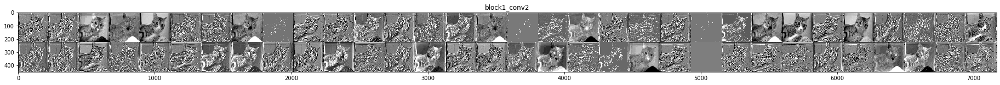

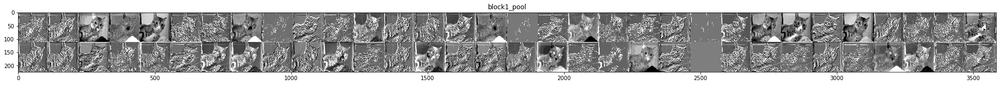

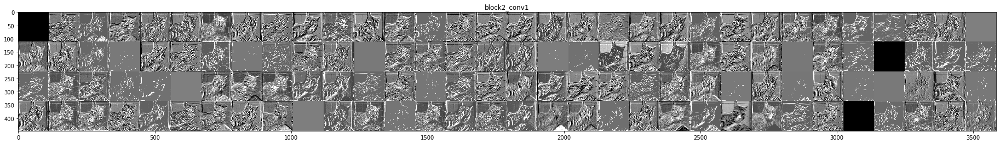

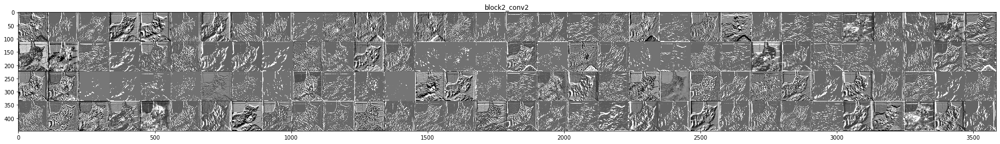

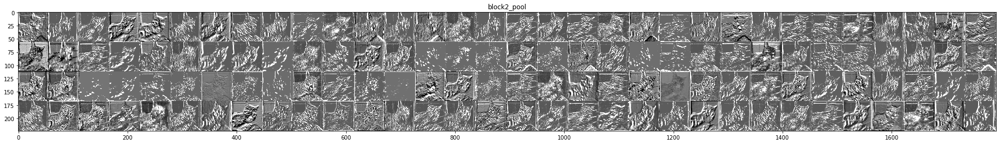

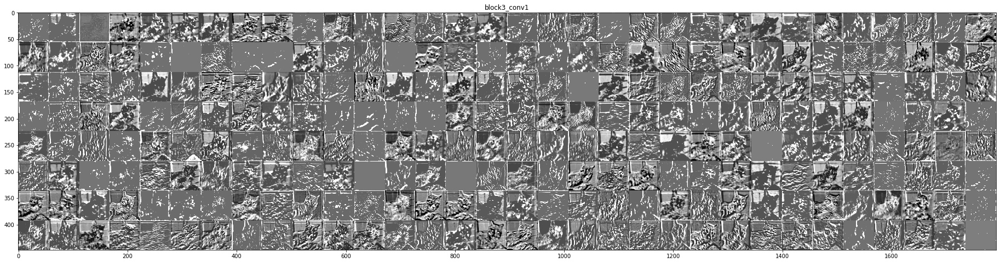

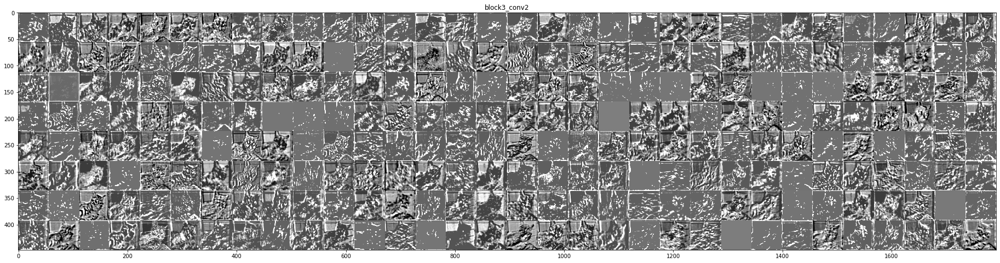

In [0]:
layer_names = []
for layer in model.layers[1:9]:
    layer_names.append(layer.name)
images_per_row = 32

conv_layer_names = []
for layer_name in layer_names:
    
      conv_layer_names.append(layer_name)

for layer_name, layer_activation in zip(conv_layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :,col * images_per_row + row]
            
            
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
            row * size : (row + 1) * size] = channel_image
            
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
    scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gray')

# Classify cats and dogs images with features from CNN using SVM/KNN/

In [0]:
from keras.models import Model
model.layers.pop() 
model2 = Model(model.input, model.layers[-1].output)
model2.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [0]:
from keras.applications.vgg16 import preprocess_input

folder1 = '/tmp/cats_and_dogs_filtered/validation/cats/'
folder2 = '/tmp/cats_and_dogs_filtered/validation/dogs/'
labels = []
CNN_features = []
for ind, image_path,  in enumerate(os.listdir(folder1)):
    print (image_path)
    if image_path.find('cat')!=-1:
        labels.append(1)
    else:
        labels.append(0)
    img = image.load_img(folder1+'/'+image_path, target_size=(224, 224,3))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    CNN_features.append(model2.predict(x)[0].flatten())

for ind, image_path,  in enumerate(os.listdir(folder2)):
    print (image_path)
    if image_path.find('dog')!=-1:
        labels.append(0)
    else:
        labels.append(1)
    img = image.load_img(folder2+'/'+image_path, target_size=(224, 224,3))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    CNN_features.append(model2.predict(x)[0].flatten())

cat.2311.jpg
cat.2453.jpg
cat.2163.jpg
cat.2060.jpg
cat.2491.jpg
cat.2277.jpg
cat.2139.jpg
cat.2172.jpg
cat.2483.jpg
cat.2102.jpg
cat.2329.jpg
cat.2005.jpg
cat.2408.jpg
cat.2136.jpg
cat.2164.jpg
cat.2321.jpg
cat.2051.jpg
cat.2273.jpg
cat.2399.jpg
cat.2090.jpg
cat.2118.jpg
cat.2433.jpg
cat.2252.jpg
cat.2333.jpg
cat.2461.jpg
cat.2481.jpg
cat.2076.jpg
cat.2173.jpg
cat.2426.jpg
cat.2322.jpg
cat.2232.jpg
cat.2372.jpg
cat.2484.jpg
cat.2281.jpg
cat.2242.jpg
cat.2358.jpg
cat.2307.jpg
cat.2401.jpg
cat.2391.jpg
cat.2357.jpg
cat.2160.jpg
cat.2246.jpg
cat.2253.jpg
cat.2405.jpg
cat.2028.jpg
cat.2376.jpg
cat.2229.jpg
cat.2430.jpg
cat.2309.jpg
cat.2260.jpg
cat.2079.jpg
cat.2410.jpg
cat.2198.jpg
cat.2122.jpg
cat.2020.jpg
cat.2340.jpg
cat.2368.jpg
cat.2437.jpg
cat.2049.jpg
cat.2204.jpg
cat.2170.jpg
cat.2486.jpg
cat.2432.jpg
cat.2209.jpg
cat.2074.jpg
cat.2190.jpg
cat.2419.jpg
cat.2145.jpg
cat.2197.jpg
cat.2109.jpg
cat.2489.jpg
cat.2135.jpg
cat.2231.jpg
cat.2259.jpg
cat.2185.jpg
cat.2073.jpg
cat.2447.jpg

In [0]:
CNN_features[0].shape

(4096,)

In [0]:
from sklearn.neighbors import KNeighborsClassifier

In [0]:
KNN = KNeighborsClassifier(n_neighbors=2)

In [0]:
KNN.fit(CNN_features[::2], labels[::2])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                     weights='uniform')

In [0]:
from sklearn.metrics import roc_auc_score
roc_auc_score(KNN.predict(CNN_features[1::2]), labels[1::2])

0.9820694179961915

In [0]:
img_rows, img_cols = 28, 28
batch_size = 2560
num_classes = 10
epochs = 25

In [0]:
from keras.datasets import mnist
from keras import backend as K

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


If you don't normalize your data, then the convergence will be slower. Your training time will be more compared to training using normalized data. I would suggest you to read the paper “ Efficient Backprop” by Yann lecun. Its a old paper. Also recent work by Sergey Ioffe and Christian szegedy shows that normalizing the hidden activation values along with the data Normalization yields much faster training. You can read the paper “Batch Normalization: Accelerating deep neural networks training by reducing internal covariate shift”.

In [0]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

In [0]:
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
print(model.summary())


model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_6 (Dropout)          (None, 128)              

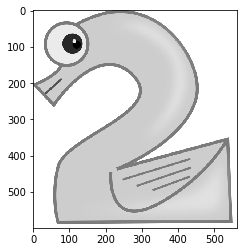

In [0]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
img = cv2.imread('animal_number_2.png',cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap='gray')


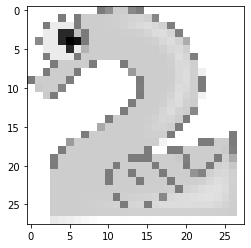

In [0]:
img=cv2.resize(img,(28,28))
plt.imshow(img, cmap='gray')

In [0]:
model.predict(255 - img.reshape((1, 28,28,1))).argmax()

3

# Task 4

In [0]:
from keras.preprocessing.image import ImageDataGenerator

In [0]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False)

In [0]:
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
history=model.fit_generator(datagen.flow(x_train, y_train, batch_size=320),
                    steps_per_epoch=60000//320, epochs=10)

Epoch 1/10


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:716: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:724: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


187/187 [==============================] - 23s 124ms/step - loss: 0.1305 - acc: 0.9608
Epoch 2/10
187/187 [==============================] - 22s 118ms/step - loss: 0.1119 - acc: 0.9663
Epoch 3/10
187/187 [==============================] - 22s 119ms/step - loss: 0.1053 - acc: 0.9686
Epoch 4/10
187/187 [==============================] - 22s 118ms/step - loss: 0.0991 - acc: 0.9709
Epoch 5/10
187/187 [==============================] - 22s 119ms/step - loss: 0.0913 - acc: 0.9739
Epoch 6/10
187/187 [==============================] - 22s 119ms/step - loss: 0.0845 - acc: 0.9744
Epoch 7/10
187/187 [==============================] - 22s 119ms/step - loss: 0.0829 - acc: 0.9755
Epoch 8/10
187/187 [==============================] - 22s 119ms/step - loss: 0.0761 - acc: 0.9770
Epoch 9/10
187/187 [==============================] - 22s 119ms/step - loss: 0.0754 - acc: 0.9778
Epoch 10/10
187/187 [==============================] - 23s 122ms/step - loss: 0.0733 - acc: 0.9788


In [0]:
model.predict(255 - img.reshape((1, 28,28,1))).argmax()

2

In [0]:
x_train.shape

(60000, 28, 28, 1)

# Inverted

In [0]:
def inverte(imagem):
    return (255-imagem)

x_train_inverted=x_train.copy()
for i in range(x_train.shape[0]):
  x_train_inverted[i]=inverte(x_train_inverted[i])

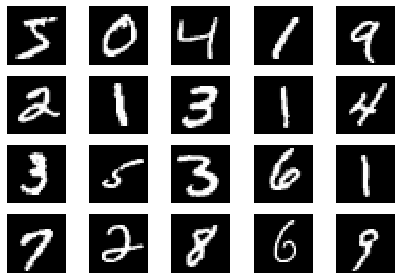

In [0]:
 
ROW = 4
COLUMN = 5
for i in range(ROW * COLUMN):
    # train[i][0] is i-th image data with size 28x28
    image = x_train[i].reshape(28, 28)   # not necessary to reshape if ndim is set to 2
    plt.subplot(ROW, COLUMN, i+1)          # subplot with size (width 3, height 5)
    plt.imshow(image, cmap='gray')  # cmap='gray' is for black and white picture.
    # train[i][1] is i-th digit label
    
    plt.axis('off')  # do not show axis value
plt.tight_layout()   # automatic padding between subplots
plt.show()

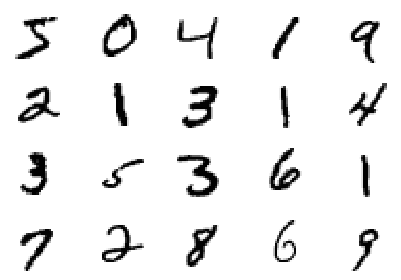

In [0]:
ROW = 4
COLUMN = 5
for i in range(ROW * COLUMN):
    # train[i][0] is i-th image data with size 28x28
    image = x_train_inverted[i].reshape(28, 28)   
    plt.subplot(ROW, COLUMN, i+1)          
    plt.imshow(image, cmap='gray')  
    
    
    plt.axis('off')  # do not show axis value
plt.tight_layout()   # automatic padding between subplots
plt.show()

In [0]:
x_train_2 = np.concatenate((x_train, x_train_inverted), axis=0)

In [0]:
y_train_2= np.concatenate((y_train, y_train), axis=0)

In [0]:
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [0]:
model.fit(x_train_2, y_train_2,
          batch_size=batch_size,
          epochs=10,
          verbose=1,
          )
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/10
120000/120000 [==============================] - 12s 101us/step - loss: 7.2820 - acc: 0.5440
Epoch 2/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2770 - acc: 0.5453
Epoch 3/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2737 - acc: 0.5460
Epoch 4/10
120000/120000 [==============================] - 10s 85us/step - loss: 7.2720 - acc: 0.5466
Epoch 5/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2720 - acc: 0.5466
Epoch 6/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2715 - acc: 0.5468
Epoch 7/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2705 - acc: 0.5471
Epoch 8/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2692 - acc: 0.5474
Epoch 9/10
120000/120000 [==============================] - 10s 84us/step - loss: 7.2697 - acc: 0.5473
Epoch 10/10
120000/120000 [==============================] - 10s 84us/st

In [0]:
model.predict(255 - img.reshape((1, 28,28,1))).argmax()

2